In [40]:
import scanpy as sc
import harmonypy as hm
import pandas as pd
import anndata as ad
import numpy as np
import scrublet as scr
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy import io
from scipy import sparse

import warnings
warnings.filterwarnings('ignore')

random_State = 7

In [41]:
adata = sc.read("/data/BCI-SingleCell/SCC_Atlas/Sam_Nicholls/Combined_adata_object_HR.h5ad")

In [5]:
is_dense = isinstance(adata.X, np.ndarray)
print("adata.X is dense:", is_dense)

adata.X is dense: True


In [6]:
count_matrix = pd.DataFrame(adata.X, index=adata.obs.index, columns=adata.var.index)
#count_matrix = pd.DataFrame(adata.X.todense(), index=adata.var.index, columns=adata.obs.index)
# Display the count matrix
count_matrix = count_matrix.T
count_matrix

,AAACCTGAGAAACCTA,AAACCTGAGCATCATC,AAACCTGAGCGGATCA,AAACCTGAGCTCAACT,AAACCTGAGCTCCTTC,AAACCTGAGGGATCTG,AAACCTGAGTACTTGC,AAACCTGAGTGGTAGC,AAACCTGCACAGGTTT,AAACCTGCACCCTATC,...,TTTGTTGAGGGATGTC-1,TTTGTTGCACCGGCTA-1,TTTGTTGCACTATCCC-1,TTTGTTGCAGCATCTA-1,TTTGTTGCAGCTAACT-1,TTTGTTGCAGTGTATC-1,TTTGTTGGTCAGGTAG-1,TTTGTTGTCCCATTCG-1,TTTGTTGTCTCTATAC-1,TTTGTTGTCTTACGGA-1
7SK.2,-0.590046,-0.265562,-0.549777,-0.285351,-0.582003,-0.562819,-0.539061,-0.555088,-0.560531,-0.530457,...,-0.173442,-0.047827,-0.244654,-0.105240,-0.320284,0.020334,-0.137077,-0.273327,-0.318813,-0.298180
A2M,-0.395971,0.574550,-0.381974,-0.237231,-0.407388,-0.383481,-0.397456,-0.386799,-0.391170,2.827041,...,-0.230679,-0.184068,-0.297855,-0.388157,-0.312887,-0.162618,-0.389764,-0.347250,-0.333038,-0.374184
ABCA8,-0.195649,-0.106658,-0.186827,1.548845,8.119349,-0.188561,-0.191606,-0.189095,-0.191208,-0.182572,...,-0.096776,-0.068161,-0.128120,-0.149069,-0.140512,-0.054060,-0.152534,-0.149033,-0.147858,-0.161268
ABCC9,-0.202466,-0.093322,-0.194723,2.955520,-0.214691,4.018989,-0.211274,-0.198630,-0.202079,-0.190951,...,-0.102504,-0.075492,-0.157309,-0.264968,-0.160945,-0.064558,-0.261924,-0.201031,-0.180685,-0.223540
AC002064.4,-0.005683,-0.003345,-0.005191,-0.003742,-0.005104,-0.005453,-0.004410,-0.005155,-0.005138,-0.004956,...,-0.001280,0.000157,-0.000717,0.005680,-0.002022,0.001067,0.004970,0.000266,-0.001306,0.000580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZBTB20-AS5,-0.003422,0.011769,-0.004665,0.014778,-0.011096,-0.002681,-0.015030,-0.006057,-0.007184,-0.005230,...,-0.005576,-0.007912,-0.025544,-0.102346,-0.017329,-0.011187,-0.096421,-0.045259,-0.028170,-0.054051
ZDHHC22,-0.006565,-0.001520,-0.006080,-0.001649,-0.006804,-0.006166,-0.006405,-0.006215,-0.006339,-0.005846,...,-0.001066,0.000515,-0.002926,-0.004525,-0.003570,0.001283,-0.004685,-0.004202,-0.004040,-0.004933
ZNF683,-0.134102,-0.063799,-0.125531,-0.067894,-0.132754,-0.128229,-0.123742,-0.126737,-0.127960,-0.121417,...,-0.044902,-0.018089,-0.061146,-0.035026,-0.076956,-0.003638,-0.041560,-0.068259,-0.077172,-0.074018
ZNF80,-0.080060,-0.032283,-0.075012,-0.034088,-0.081144,-0.076201,-0.076496,-0.076116,-0.077163,-0.072582,...,-0.024821,-0.008641,-0.039993,-0.042941,-0.047816,-0.000426,-0.045540,-0.049391,-0.050673,-0.055199


In [9]:
#Creating matrix to use in AUCell
# Example: if count_matrix is a DataFrame
sparse_matrix = sparse.csr_matrix(count_matrix.values)

# Save as Matrix Market
io.mmwrite('/data/BCI-SingleCell/SCC_Atlas/Sam_Nicholls/cSCC_HR.mtx', sparse_matrix)
# Save gene names (row names) to genes.txt
count_matrix.index.to_series().to_csv('genes.txt', index=False, header=False)
# Save barcodes (column names) to barcodes.txt
pd.Series(count_matrix.columns).to_csv('barcodes.txt', index=False, header=False)

In [7]:
adata.X.shape

(335124, 2000)

In [10]:
adata

AnnData object with n_obs × n_vars = 335124 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Condition', 'Patient_ID', 'level1_celltype', 'level2_celltype', 'level3_celltype', 'treatment', 'cluster', 'UMAP1', 'UMAP2', 'Dataset', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'doublet_scores', 'predicted_doublets', 'clusters_r06', 'clusters_r08', 'clusters_r1'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'Condition_colors', 'Patient_ID_colors', 'clusters_r06', 'clusters_r06_colors', 'clusters_r08', 'clusters_r08_colors', 'clusters_r1', 'clusters_r1_colors', 'hvg', 'log1p', 'neighbors', 'pca'

### QC Plots

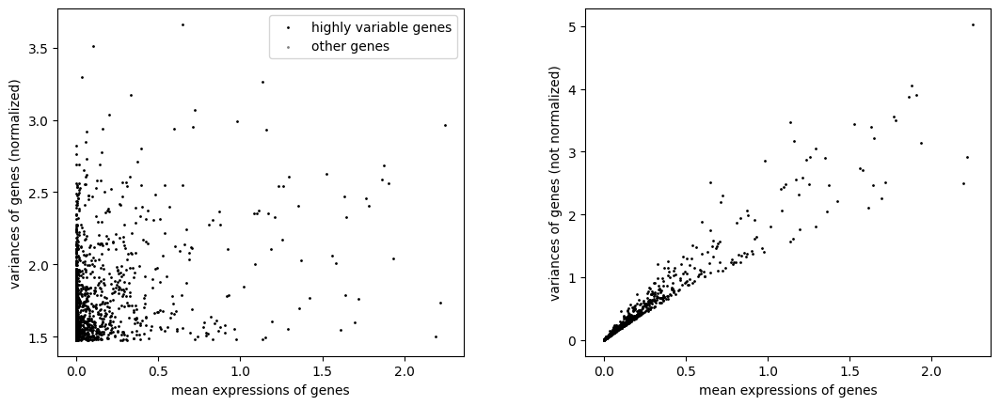

In [5]:
sc.pl.highly_variable_genes(adata, save = "HVGs.png")

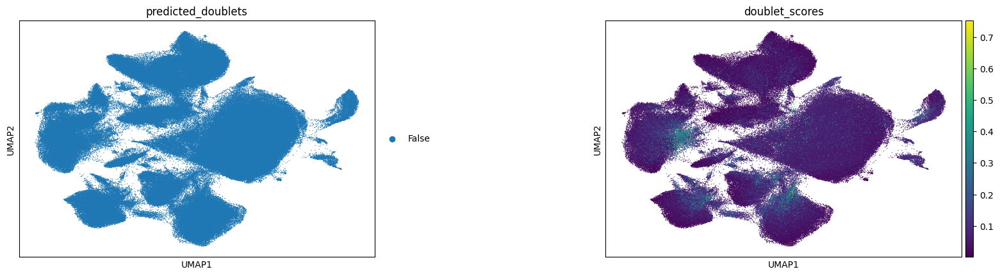

In [15]:
sc.pl.umap(
    adata,
    color=["predicted_doublets", "doublet_scores"],
    # increase horizontal space between panels
    wspace=0.5,
    size=3, save='_Doublets.png'
)

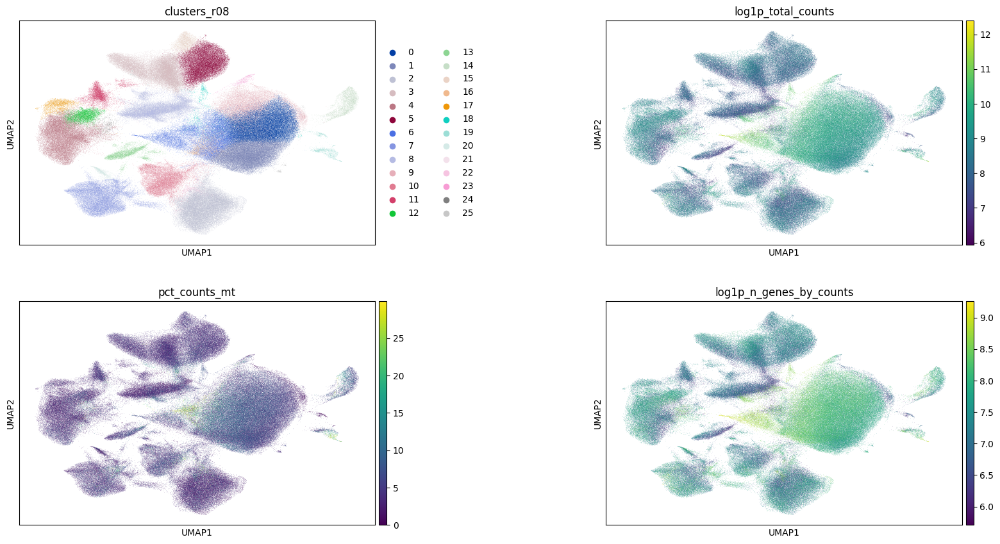

In [14]:
sc.pl.umap(
    adata,
    color=["clusters_r08", "log1p_total_counts", "pct_counts_mt", "log1p_n_genes_by_counts"],
    wspace=0.5,
    ncols=2, save = '_QC_Metrics.png'
)

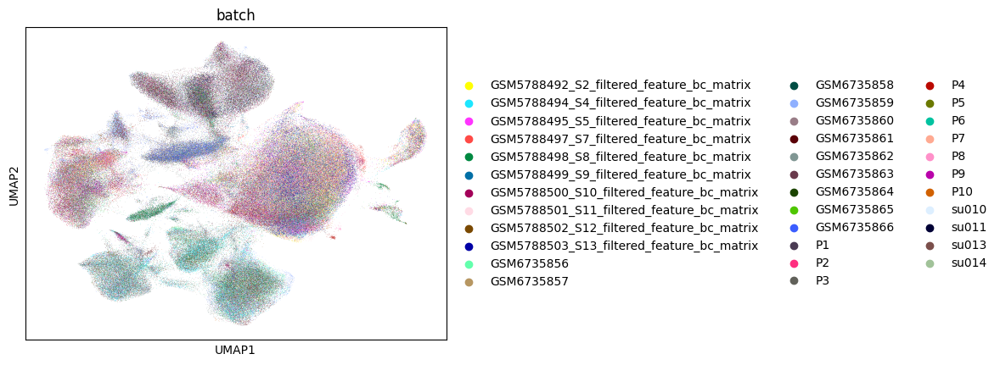

In [13]:
sc.pl.umap(adata, color = ['batch'], save = '_batch.png')

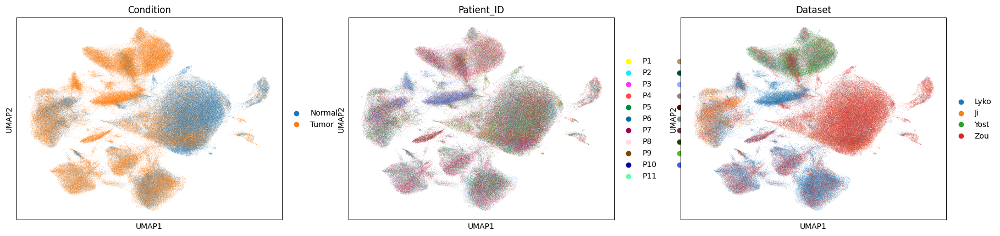

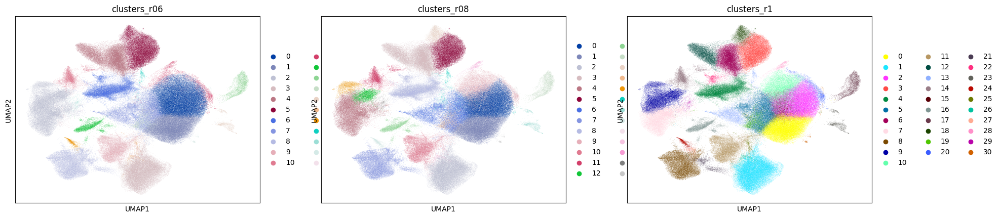

In [12]:
sc.pl.umap(adata, color = ['Condition', 'Patient_ID', 'Dataset'], save='_norm_tum, Patient, Dataset.png')
sc.pl.umap(adata, color = ['clusters_r06', 'clusters_r08', 'clusters_r1'], save = '_resolutions.png')

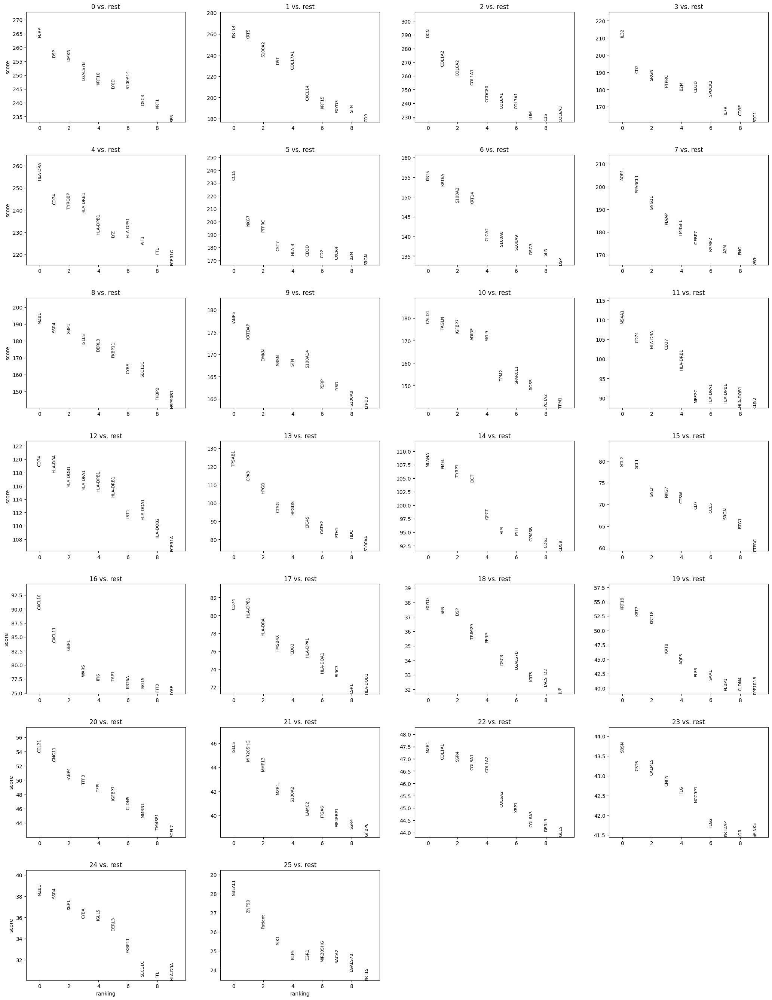

In [15]:
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False)

### Celltypist Annotations

In [11]:
#Celltypist annotations
import celltypist
from celltypist import models

#Downloaad skin model
models.download_models(model = 'Adult_Human_Skin.pkl')
Skin_Model = models.Model.load(model = 'Adult_Human_Skin.pkl')

#Making names unique is reuired for celltypist
adata.obs['original_barcodes'] = adata.obs_names
adata.obs_names_make_unique()

predictions = celltypist.annotate(adata, model=Skin_Model, majority_voting=True)

📂 Storing models in /data/home/ha20577/.celltypist/data/models
💾 Total models to download: 1
⏩ Skipping [1/1]: Adult_Human_Skin.pkl (file exists)
👀 Invalid expression matrix in `.X`, expect log1p normalized expression to 10000 counts per cell; will use `.raw.X` instead
🔬 Input data has 335124 cells and 46209 genes
🔗 Matching reference genes in the model
🧬 3224 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 30
🗳️ Majority voting the predictions
✅ Majority voting done!


In [12]:
adata.obs['celltypist_labels_abrv'] = predictions.predicted_labels['predicted_labels']

In [13]:
adata.obs['celltypist_labels_abrv'].cat.categories

Index(['DC1', 'DC2', 'Differentiated_KC', 'F1', 'F2', 'F3', 'ILC1_3',
       'ILC1_NK', 'ILC2', 'Inf_mac', 'LC', 'LE1', 'LE2', 'Macro_1', 'Macro_2',
       'Mast_cell', 'Melanocyte', 'MigDC', 'Mono_mac', 'NK', 'Pericyte_1',
       'Pericyte_2', 'Plasma', 'Schwann_1', 'Schwann_2', 'Tc', 'Th', 'Treg',
       'Undifferentiated_KC', 'VE1', 'VE2', 'VE3', 'migLC', 'moDC'],
      dtype='object')

In [14]:
#Renaming the abbreviations to cell types as noted in the original article: Gary Reynolds DOI: 10.1126/science.aba6500
adata.obs['celltypist_labels'] = adata.obs['celltypist_labels_abrv'].map({
    'DC1':'Dendritic Cell',
    'DC2':'Dendritic Cell',
    'Differentiated_KC' : 'Differentiated Keratinocyte',
    'F1':'Fibroblast',
    'F2':'Fibroblast',
    'F3':'Fibroblast',
    'ILC1_3':'Innate lymphoid cell',
    'ILC1_NK':'Innate lymphoid cell / NK Cell',
    'ILC2':'Innate lymphoid cell',
    'Inf_mac': 'Inflammatory Macrophage',
    'LC':'Langerhans Cell',
    'LE1':'lymphatic endothelium',
    'LE2':'lymphatic endothelium',
    'Macro_1':'Macrophage',
    'Macro_2':'Macrophage',
    'Mast_cell':'Mast Cell',
    'Melanocyte':'Melanocyte',
    'MigDC':'Migratory Dendritic Cell',
    'Mono_mac':'Monocyte derived macrophage',
    'NK':'NK Cell',
    'Pericyte_1':'Pericyte',
    'Pericyte_2':'Pericyte',
    'Plasma':'Plasma Cell',
    'Schwann_1':'Schwann Cell',
    'Schwann_2':'Schwann Cell',
    'Tc':'Cytotoxic T Cell',
    'Th':'T helper cell',
    'Treg':'Regulatory T Cell',
    'Undifferentiated_KC':'Undifferentiated Keratinocyte',
    'VE1':'Vascular Endothelium',
    'VE2':'Vascular Endothelium',
    'VE3':'Vascular Endothelium',
    'migLC':'Migratory Langerhans Cell',
    'moDC':'Monocyte Derived Dendritic Cell'
})

... storing 'original_barcodes' as categorical
... storing 'celltypist_labels' as categorical


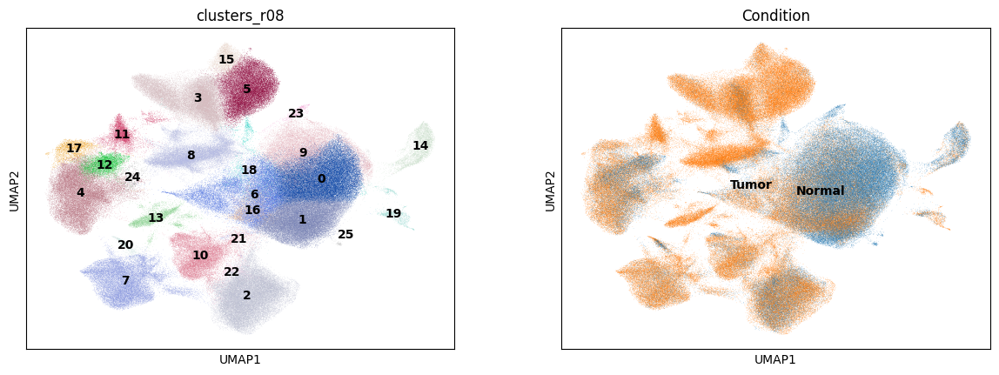

In [19]:
sc.pl.umap(adata, color=['clusters_r08', "Condition"], legend_loc='on data')

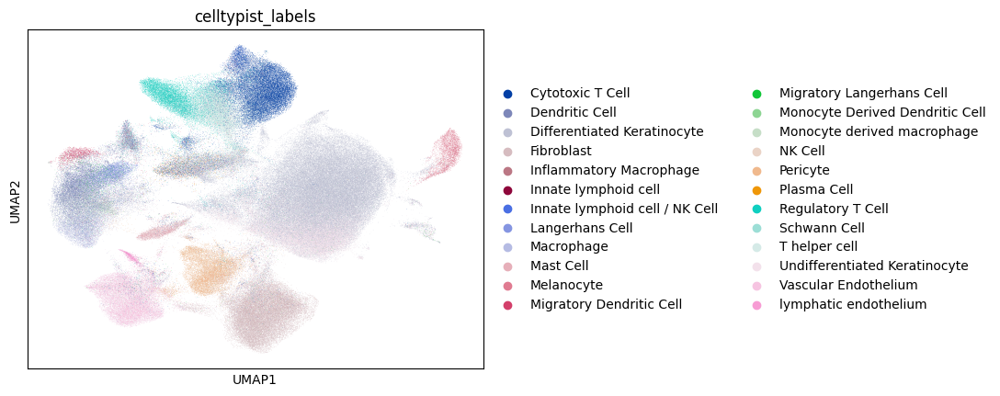

In [22]:
sc.pl.umap(adata, color = 'celltypist_labels')

### Manual Annotations at 3 Levels

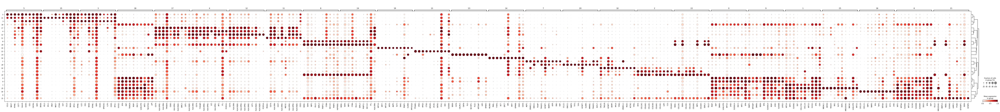

In [21]:
#Manual annotation using dotplots, I will search google for marker gene cell types
sc.pl.rank_genes_groups_dotplot(adata, groupby = 'clusters_r08', standard_scale = 'var', n_genes = 10)

In [23]:
#There is some overlap between clusters so filtering to make more precise
sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.4,
    key_added="dea_filtered",
)

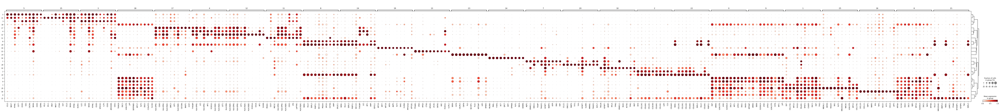

In [25]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="clusters_r08",
    standard_scale="var",
    n_genes=10,
    key="dea_filtered",
)

In [27]:
# Get top 10 DE genes per cluster
top_de_genes = {}

for group in adata.uns['dea_filtered']['names'].dtype.names:
    df = sc.get.rank_genes_groups_df(adata, group=group).head(5)
    top_de_genes[group] = df['names'].tolist()

# Print results
for cluster, genes in top_de_genes.items():
    print(f"Cluster {cluster}: {genes}")

Cluster 0: ['PERP', 'DSP', 'DMKN', 'LGALS7B', 'KRT10']
Cluster 1: ['KRT14', 'KRT5', 'S100A2', 'DST', 'COL17A1']
Cluster 2: ['DCN', 'COL1A2', 'COL6A2', 'COL1A1', 'CCDC80']
Cluster 3: ['IL32', 'CD2', 'SRGN', 'PTPRC', 'B2M']
Cluster 4: ['HLA-DRA', 'CD74', 'TYROBP', 'HLA-DRB1', 'HLA-DPB1']
Cluster 5: ['CCL5', 'NKG7', 'PTPRC', 'CST7', 'HLA-B']
Cluster 6: ['KRT5', 'KRT6A', 'S100A2', 'KRT14', 'CLCA2']
Cluster 7: ['AQP1', 'SPARCL1', 'GNG11', 'PLVAP', 'TM4SF1']
Cluster 8: ['MZB1', 'SSR4', 'XBP1', 'IGLL5', 'DERL3']
Cluster 9: ['FABP5', 'KRTDAP', 'DMKN', 'SBSN', 'SFN']
Cluster 10: ['CALD1', 'TAGLN', 'IGFBP7', 'ADIRF', 'MYL9']
Cluster 11: ['MS4A1', 'CD74', 'HLA-DRA', 'CD37', 'HLA-DRB1']
Cluster 12: ['CD74', 'HLA-DRA', 'HLA-DQB1', 'HLA-DPA1', 'HLA-DPB1']
Cluster 13: ['TPSAB1', 'CPA3', 'HPGD', 'CTSG', 'HPGDS']
Cluster 14: ['MLANA', 'PMEL', 'TYRP1', 'DCT', 'QPCT']
Cluster 15: ['XCL2', 'XCL1', 'GNLY', 'NKG7', 'CTSW']
Cluster 16: ['CXCL10', 'CXCL11', 'GBP1', 'WARS', 'IFI6']
Cluster 17: ['CD74', 'HLA-DP

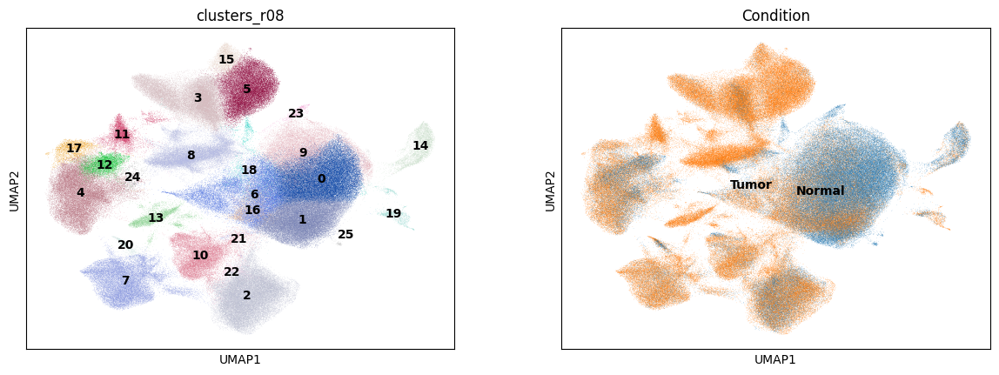

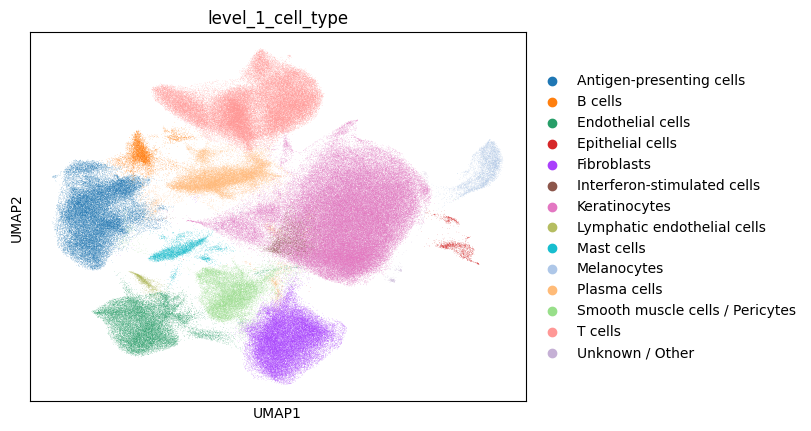

In [42]:
#ANnotation dict is chatgpt, refine later
#level1 cell type
annotation_dict = {
    '0': 'Keratinocytes',    # PERP, DSP, KRT10 - markers of differentiated keratinocytes
    '1': 'Keratinocytes',              # KRT14, KRT5, COL17A1 - basal layer keratinocytes
    '2': 'Fibroblasts',                      # DCN, COL1A1, COL6A2 - fibroblast markers
    '3': 'T cells',                          # CD2, PTPRC (CD45), B2M - T cell markers
    '4': 'Antigen-presenting cells', # HLA-DRA, CD74 - MHC class II related, APCs (e.g., dendritic cells, macrophages)
    '5': 'T cells',  # CCL5, NKG7, CST7 - cytotoxic T or NK cells
    '6': 'Keratinocytes', # KRT5, KRT6A, KRT14 - proliferative basal keratinocytes
    '7': 'Endothelial cells',                # AQP1, PLVAP - endothelial markers
    '8': 'Plasma cells',                     # MZB1, XBP1, IGLL5 - plasma cell markers
    '9': 'Keratinocytes',    # FABP5, KRTDAP, DMKN - keratinocyte differentiation
    '10': 'Smooth muscle cells / Pericytes', # CALD1, TAGLN, MYL9 - smooth muscle markers
    '11': 'B cells',                         # MS4A1 (CD20), CD74, HLA-DRA - B cell markers
    '12': 'Antigen-presenting cells',        # CD74, HLA-DRA etc. - APC markers
    '13': 'Mast cells',                      # TPSAB1, CPA3 - mast cell markers
    '14': 'Melanocytes',                     # MLANA, PMEL, TYRP1 - melanocyte markers
    '15': 'T cells',           # XCL1, XCL2, NKG7 - cytotoxic cells
    '16': 'Interferon-stimulated cells',     # CXCL10, GBP1 - interferon response genes
    '17': 'Antigen-presenting cells',        # CD74, HLA-DPB1 - APC markers
    '18': 'Keratinocytes',  # FXYD3, SFN, DSP - keratinocyte markers
    '19': 'Epithelial cells',        # KRT19, KRT7, KRT18 - epithelial markers
    '20': 'Lymphatic endothelial cells',     # CCL21, GNG11 - lymphatic endothelial cells markers
    '21': 'Plasma cells',        # IGLL5, MZB1 - plasma/B cell markers
    '22': 'Fibroblasts',     # MZB1, COL1A1 - fibroblast/stromal cells
    '23': 'Keratinocytes',  # SBSN, CST6, FLG - keratinocyte differentiation
    '24': 'Plasma cells',                     # MZB1, XBP1 - plasma cells
    '25': 'Unknown / Other',                  # Genes like NBEAL1, ZNF90 less specific
}

              
#Adding the cell type to my data
adata.obs['level_1_cell_type'] = adata.obs['clusters_r08'].map(annotation_dict).astype('category')

#Annotated UMAP
sc.pl.umap(adata, color=['clusters_r08', 'Condition'], legend_loc='on data')
sc.pl.umap(adata, color = 'level_1_cell_type')

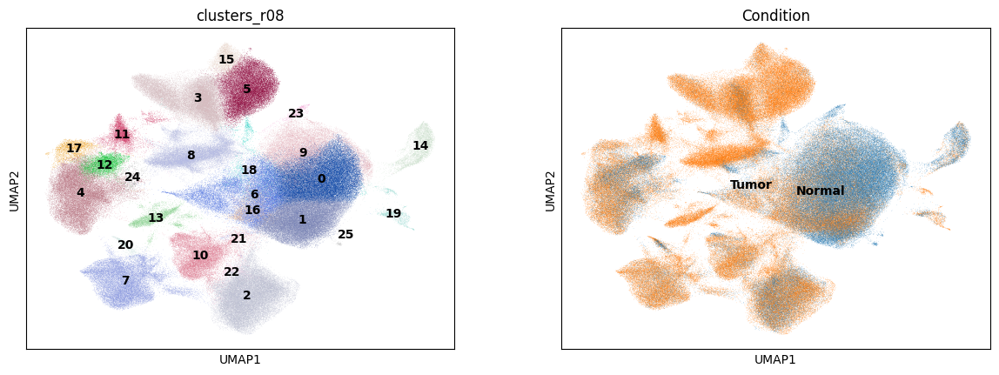

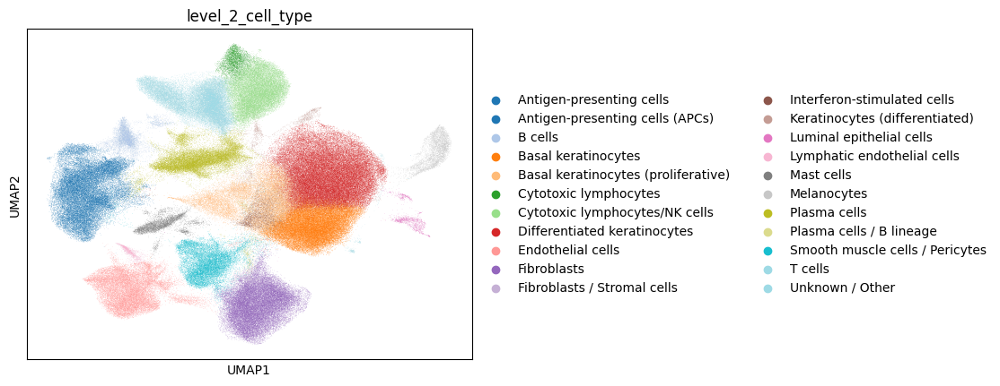

In [43]:
#Level 2 annotation
cluster_annotation = {
    '0': 'Differentiated keratinocytes',    # PERP, DSP, KRT10 - markers of differentiated keratinocytes
    '1': 'Basal keratinocytes',              # KRT14, KRT5, COL17A1 - basal layer keratinocytes
    '2': 'Fibroblasts',                      # DCN, COL1A1, COL6A2 - fibroblast markers
    '3': 'T cells',                          # CD2, PTPRC (CD45), B2M - T cell markers
    '4': 'Antigen-presenting cells (APCs)', # HLA-DRA, CD74 - MHC class II related, APCs (e.g., dendritic cells, macrophages)
    '5': 'Cytotoxic lymphocytes/NK cells',  # CCL5, NKG7, CST7 - cytotoxic T or NK cells
    '6': 'Basal keratinocytes (proliferative)', # KRT5, KRT6A, KRT14 - proliferative basal keratinocytes
    '7': 'Endothelial cells',                # AQP1, PLVAP - endothelial markers
    '8': 'Plasma cells',                     # MZB1, XBP1, IGLL5 - plasma cell markers
    '9': 'Differentiated keratinocytes',    # FABP5, KRTDAP, DMKN - keratinocyte differentiation
    '10': 'Smooth muscle cells / Pericytes', # CALD1, TAGLN, MYL9 - smooth muscle markers
    '11': 'B cells',                         # MS4A1 (CD20), CD74, HLA-DRA - B cell markers
    '12': 'Antigen-presenting cells',        # CD74, HLA-DRA etc. - APC markers
    '13': 'Mast cells',                      # TPSAB1, CPA3 - mast cell markers
    '14': 'Melanocytes',                     # MLANA, PMEL, TYRP1 - melanocyte markers
    '15': 'Cytotoxic lymphocytes',           # XCL1, XCL2, NKG7 - cytotoxic cells
    '16': 'Interferon-stimulated cells',     # CXCL10, GBP1 - interferon response genes
    '17': 'Antigen-presenting cells',        # CD74, HLA-DPB1 - APC markers
    '18': 'Keratinocytes (differentiated)',  # FXYD3, SFN, DSP - keratinocyte markers
    '19': 'Luminal epithelial cells',        # KRT19, KRT7, KRT18 - epithelial markers
    '20': 'Lymphatic endothelial cells',     # CCL21, GNG11 - lymphatic endothelial cells markers
    '21': 'Plasma cells / B lineage',        # IGLL5, MZB1 - plasma/B cell markers
    '22': 'Fibroblasts / Stromal cells',     # MZB1, COL1A1 - fibroblast/stromal cells
    '23': 'Keratinocytes (differentiated)',  # SBSN, CST6, FLG - keratinocyte differentiation
    '24': 'Plasma cells',                     # MZB1, XBP1 - plasma cells
    '25': 'Unknown / Other',                  # Genes like NBEAL1, ZNF90 less specific
}

#Adding the cell type to my data
adata.obs['level_2_cell_type'] = adata.obs['clusters_r08'].map(cluster_annotation).astype('category')

#Annotated UMAP
sc.pl.umap(adata, color=['clusters_r08', 'Condition'], legend_loc='on data')
sc.pl.umap(adata, color = 'level_2_cell_type', palette='tab20')

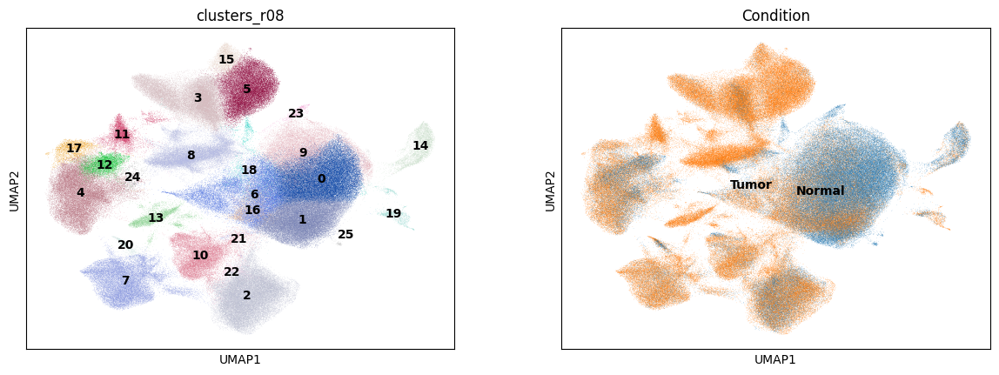

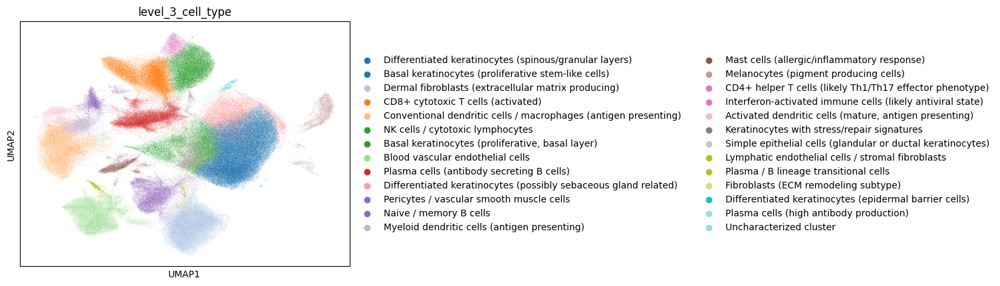

In [44]:
#Level 3 annotation
cell_type_dict = {
    '0': 'Differentiated keratinocytes (spinous/granular layers)',  # Markers: KRT10, DSP, PERP; (Cheng et al., Nat Commun 2018; Joost et al., Nat Commun 2016)
    '1': 'Basal keratinocytes (proliferative stem-like cells)',     # Markers: KRT5, KRT14, COL17A1; (Joost et al., Nat Commun 2016; Blanpain et al., Nat Rev Mol Cell Biol 2014)
    '2': 'Dermal fibroblasts (extracellular matrix producing)',     # Markers: DCN, COL1A1, COL1A2; (Tabib et al., JCI Insight 2018; Philippeos et al., J Invest Dermatol 2018)
    '3': 'CD8+ cytotoxic T cells (activated)',                     # Markers: CD8A, GNLY, NKG7; (Zheng et al., Cell 2017; Guo et al., Nat Immunol 2018)
    '4': 'Conventional dendritic cells / macrophages (antigen presenting)',  # Markers: HLA-DRA, CD74, TYROBP; (Guilliams et al., Nat Rev Immunol 2014; Villani et al., Science 2017)
    '5': 'NK cells / cytotoxic lymphocytes',                      # Markers: NKG7, CCL5, PTPRC; (Crinier et al., Immunity 2018; Freud et al., Nat Rev Immunol 2017)
    '6': 'Basal keratinocytes (proliferative, basal layer)',        # Same markers as cluster 1 (Joost et al., Nat Commun 2016)
    '7': 'Blood vascular endothelial cells',                       # Markers: AQP1, PLVAP; (Kalucka et al., Cell 2020; He et al., Nat Commun 2018)
    '8': 'Plasma cells (antibody secreting B cells)',              # Markers: MZB1, XBP1, IGLL5; (Shi et al., Nat Commun 2015; Villani et al., Science 2017)
    '9': 'Differentiated keratinocytes (possibly sebaceous gland related)',  # Markers: FABP5, KRTDAP, SBSN; (Blanpain et al., Nat Rev Mol Cell Biol 2014)
    '10': 'Pericytes / vascular smooth muscle cells',              # Markers: CALD1, TAGLN, MYL9; (Vanlandewijck et al., Cell 2018)
    '11': 'Naive / memory B cells',                                # Markers: MS4A1 (CD20), CD74, HLA-DRA; (Shapiro et al., Nat Methods 2013)
    '12': 'Myeloid dendritic cells (antigen presenting)',          # Markers: CD74, HLA genes; (Guilliams et al., Nat Rev Immunol 2014)
    '13': 'Mast cells (allergic/inflammatory response)',           # Markers: TPSAB1, CPA3; (Dahlin et al., J Exp Med 2016)
    '14': 'Melanocytes (pigment producing cells)',                 # Markers: MLANA, PMEL, TYRP1; (Shakhova et al., Nat Genet 2012)
    '15': 'CD4+ helper T cells (likely Th1/Th17 effector phenotype)',  # Markers: CD4, IL32, XCL1; (Guo et al., Nat Immunol 2018)
    '16': 'Interferon-activated immune cells (likely antiviral state)',  # Markers: CXCL10, GBP1, IFI6; (Blanco-Melo et al., Cell 2020)
    '17': 'Activated dendritic cells (mature, antigen presenting)', # Markers: CD74, HLA-DPB1, CD83; (Villani et al., Science 2017)
    '18': 'Keratinocytes with stress/repair signatures',           # Markers: SFN, DSP, PERP; (Cheng et al., Nat Commun 2018)
    '19': 'Simple epithelial cells (glandular or ductal keratinocytes)',  # Markers: KRT7, KRT19; (Ray et al., Nat Commun 2021)
    '20': 'Lymphatic endothelial cells / stromal fibroblasts',     # Markers: CCL21, GNG11; (Takeda et al., Nat Immunol 2019)
    '21': 'Plasma / B lineage transitional cells',                  # Markers: IGLL5, MZB1; (Villani et al., Science 2017)
    '22': 'Fibroblasts (ECM remodeling subtype)',                  # Markers: COL1A1, COL3A1; (Tabib et al., JCI Insight 2018)
    '23': 'Differentiated keratinocytes (epidermal barrier cells)', # Markers: SBSN, CST6, FLG; (Kubo et al., J Invest Dermatol 2012)
    '24': 'Plasma cells (high antibody production)',               # Markers: XBP1, MZB1; (Shi et al., Nat Commun 2015)
    '25': 'Uncharacterized cluster',  # No clear markers; likely doublets or rare populations
}


#Adding the cell type to my data
adata.obs['level_3_cell_type'] = adata.obs['clusters_r08'].map(cell_type_dict).astype('category')

#Annotated UMAP
sc.pl.umap(adata, color=['clusters_r08', 'Condition'], legend_loc='on data')
sc.pl.umap(adata, color = 'level_3_cell_type', palette='tab20')

### Comparing Celltypist Labels with manual Labels

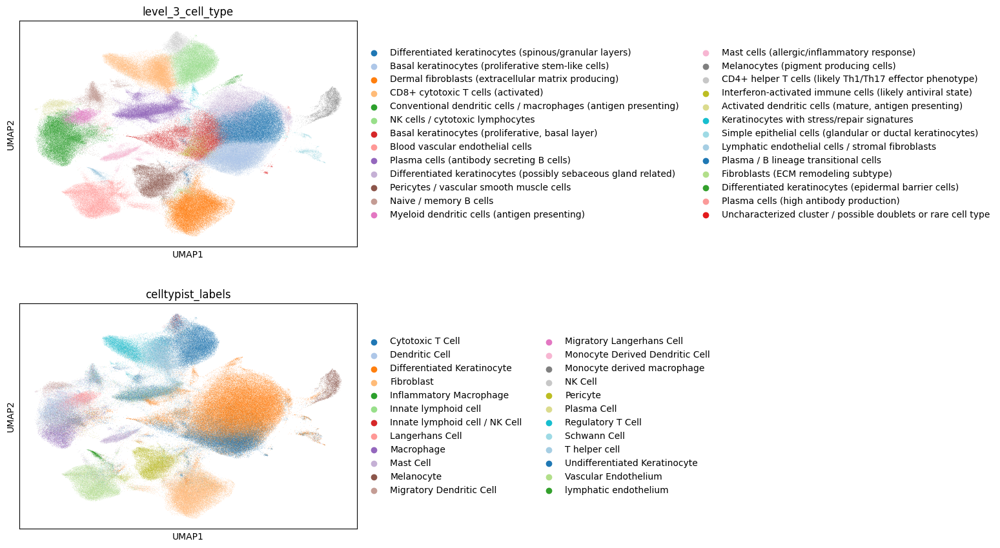

In [51]:
from matplotlib.pyplot import get_cmap
cmap1 = get_cmap("tab20").colors  # 20
cmap2 = get_cmap("Paired").colors  # 12
custom= cmap1 + cmap2

#Comparing Celltypist and manually annotated labels for cross referencing
sc.pl.umap(adata, color = ['level_3_cell_type', 'celltypist_labels'], ncols=1, palette=custom)

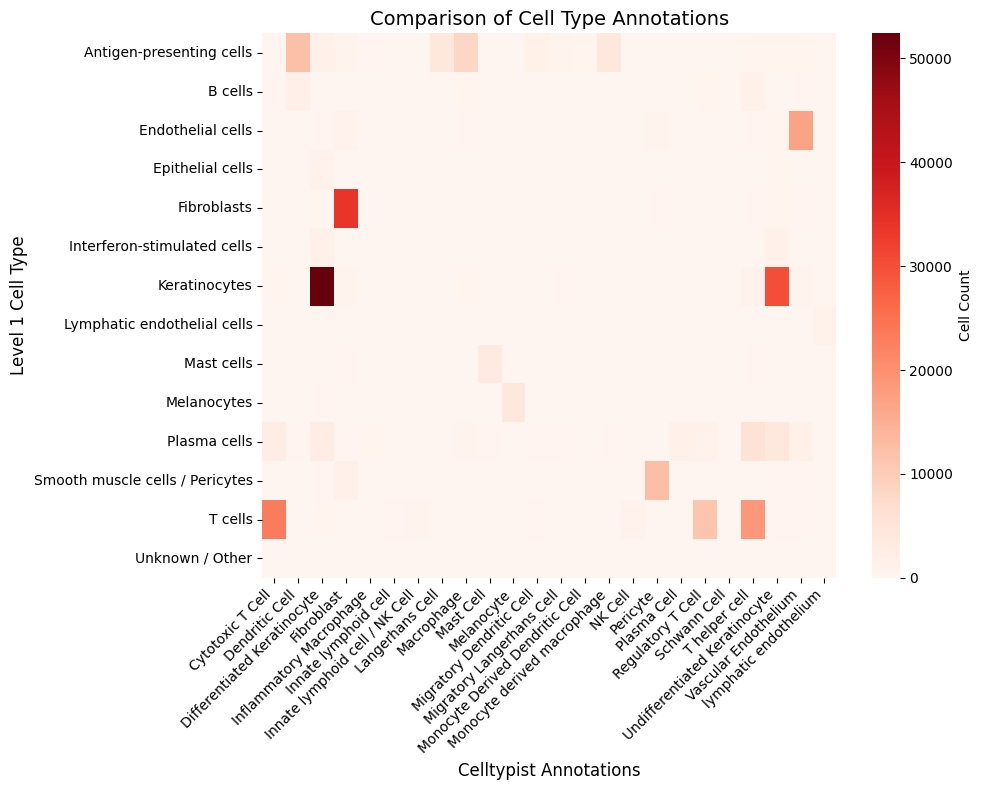

In [20]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create a contingency table (confusion matrix)
conf_matrix = pd.crosstab(adata.obs['level_1_cell_type'], adata.obs['celltypist_labels'])

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=False, cmap='Reds', vmax=conf_matrix.values.max() * 0.6, cbar_kws={'label': 'Cell Count'})
plt.xlabel('Celltypist Annotations', fontsize=12)
plt.ylabel('Level 1 Cell Type', fontsize=12)
plt.title('Comparison of Cell Type Annotations', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()
plt.save()

### Cell Type Proportion Analysis

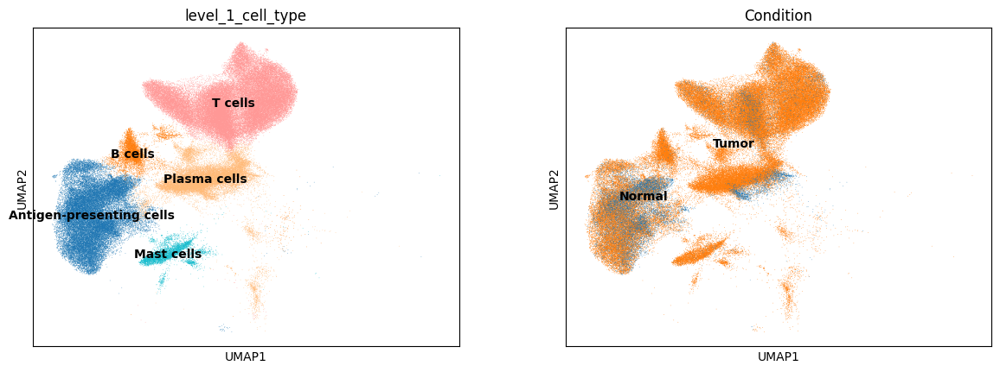

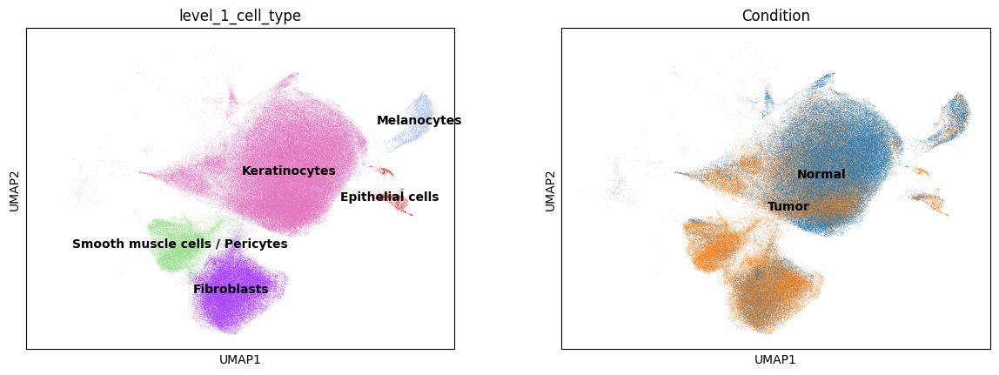

In [20]:
#Comparing normal and immune cells
#subsetting by immune cells, and non immune cells
immuneCells = ['T cells', 'B cells', 'Plasma cells', 'Mast cells', "Antigen-presenting cells"]
immune_adata = adata[adata.obs['level_1_cell_type'].isin(immuneCells)].copy()

#Plotting umaps
sc.pl.umap(immune_adata, color=['level_1_cell_type', 'Condition'], legend_loc = 'on data', save='_Immune cells tum_norm.png')

#Normal Cells
normalCells = ["Keratinocytes", 
               'Fibroblasts', 
               'Melanocytes', 
               'Endothelial Cells', 
               "Epithelial cells", 
               "Smooth muscle cells / Pericytes",
               "Lymphatic endothelial cell",]

normalcells_adata = adata[adata.obs['level_1_cell_type'].isin(normalCells)].copy()

sc.pl.umap(normalcells_adata, color=['level_1_cell_type', 'Condition'], legend_loc = 'on data', save='_normal cells _tum_norm.png')

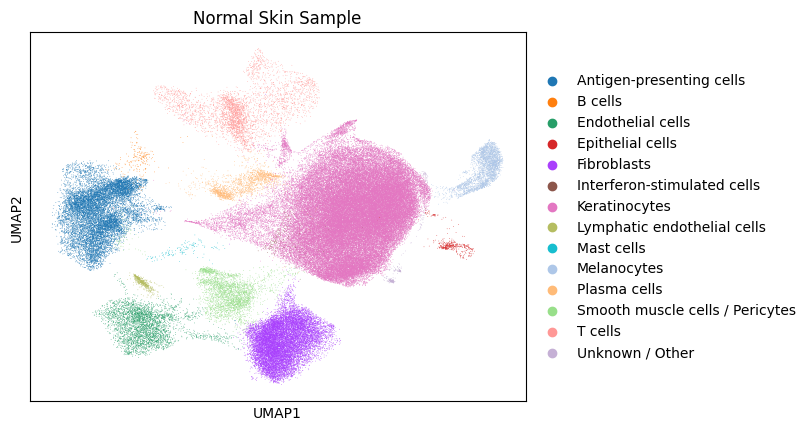

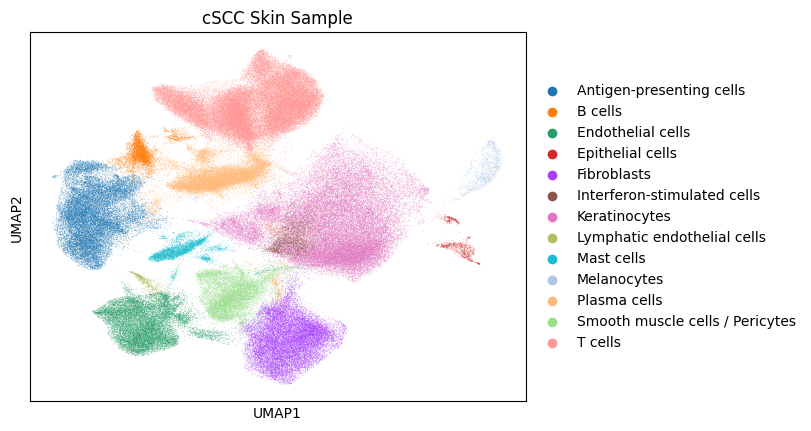

In [22]:
#Comparing umaps between normal samples and cSCC samples
adata_normal = adata[adata.obs['Condition']=='Normal'].copy()
adata_cSCC = adata[adata.obs['Condition']=='Tumor'].copy()

sc.pl.umap(adata_normal, color=['level_1_cell_type'], title='Normal Skin Sample', save='_Normal Skin clustering.png')
sc.pl.umap(adata_cSCC, color=['level_1_cell_type'], title='cSCC Skin Sample', save='_Tumor Skin clustering.png')

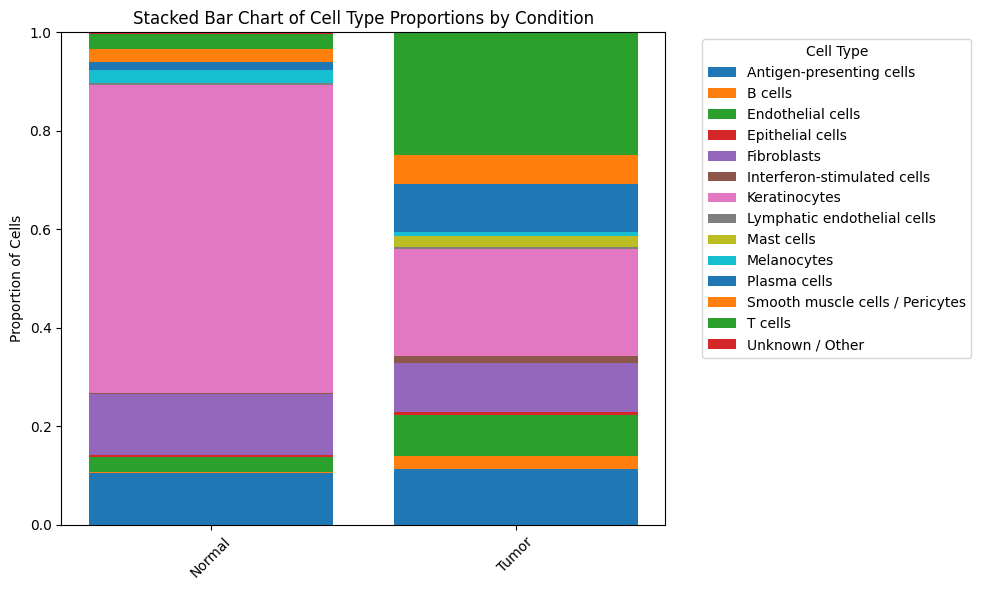

In [24]:
#Making plots to show the amount of expression for each cell type
cell_counts = adata.obs.groupby(['level_1_cell_type', 'Condition']).size().reset_index(name='counts')
total_counts =adata.obs.groupby('Condition').size().reset_index(name="counts")

cell_counts = cell_counts.merge(total_counts, on='Condition')
cell_counts['proportion'] = cell_counts['counts_x']/cell_counts['counts_y']
cell_counts

import matplotlib.pyplot as plt

# Pivot the data: rows = Condition, columns = Cell_type, values = proportion
pivot_df = cell_counts.pivot(index='Condition', columns='level_1_cell_type', values='proportion').fillna(0)

# Plot setup
fig, ax = plt.subplots(figsize=(10, 6))

# Plot stacked bars
bottom = None
for cell_type in pivot_df.columns:
    ax.bar(pivot_df.index, pivot_df[cell_type], label=cell_type, bottom=bottom)
    if bottom is None:
        bottom = pivot_df[cell_type]
    else:
        bottom += pivot_df[cell_type]

# Aesthetics
ax.set_ylabel('Proportion of Cells')
ax.set_title('Stacked Bar Chart of Cell Type Proportions by Condition')
ax.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(False)
plt.xticks(rotation=45)
plt.tight_layout()

#Save
plt.savefig("figures/cell_type_proportions.png")

# Show plot
plt.show()

### Re-Clustering keratinocytes to find TSK

In [45]:
#Separating tumor and normal keratinocytes to cluster and identify TSK
adata_ker_norm = adata[((adata.obs['level_1_cell_type'] == 'Keratinocytes') |
                        (adata.obs['level_1_cell_type'] == 'Epithelial cells')) 
                        & (adata.obs['Condition'] == 'Normal')].copy()

adata_ker_tum = adata[((adata.obs['level_1_cell_type'] == 'Keratinocytes') |
                        (adata.obs['level_1_cell_type'] == 'Epithelial cells')) 
                        & (adata.obs['Condition'] == 'Tumor')].copy()


In [87]:
print(adata_ker_norm, adata_ker_tum)

AnnData object with n_obs × n_vars = 75718 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'batch', 'Condition', 'Patient_ID', 'level1_celltype', 'level2_celltype', 'level3_celltype', 'treatment', 'cluster', 'UMAP1', 'UMAP2', 'Dataset', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'doublet_scores', 'predicted_doublets', 'clusters_r06', 'clusters_r08', 'clusters_r1', 'level_1_cell_type', 'level_2_cell_type', 'level_3_cell_type'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'Condition_colors', 'Patient_ID_colors', 'clusters_r06', 'clusters_r06_colors', 'clusters_r08', 'clusters_r08_colors', 'clusters

In [46]:
#Recomputing with higher n neghbors to prevent overclustering due to low variation among samples
sc.pp.neighbors(adata_ker_norm, n_neighbors=50, n_pcs=20)
sc.tl.leiden(adata_ker_norm, resolution=0.1, key_added='adata_ker_norm_01')

sc.pp.neighbors(adata_ker_tum, n_neighbors=50, n_pcs=20)
sc.tl.leiden(adata_ker_tum, resolution=0.1, key_added='adata_ker_tum_01')

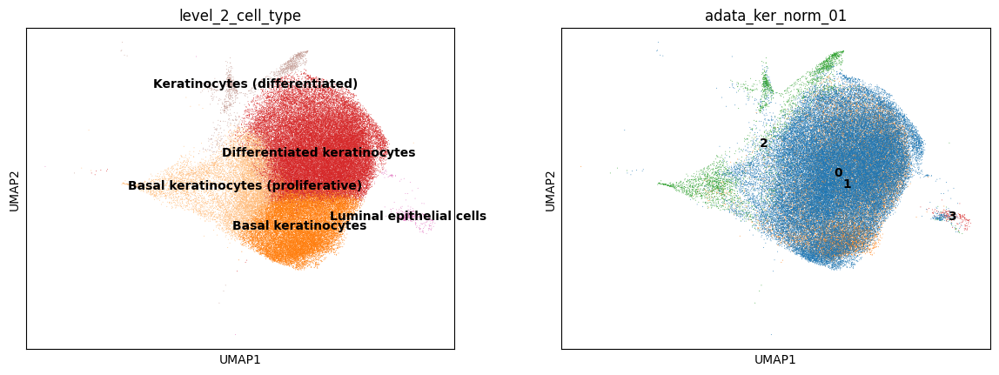

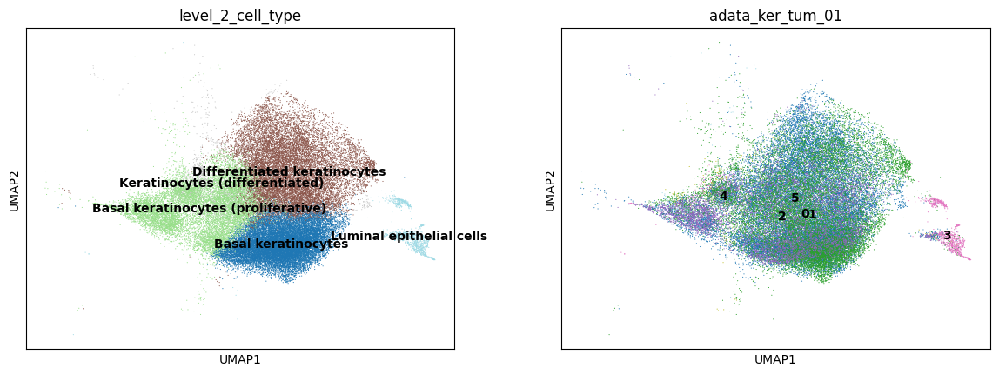

In [47]:
sc.pl.umap(adata_ker_norm, color = ['level_2_cell_type','adata_ker_norm_01'], legend_loc = 'on data', save = 'Normal Keratinocyte Clustering.png')
sc.pl.umap(adata_ker_tum, color = ['level_2_cell_type','adata_ker_tum_01'], palette='tab20', legend_loc = 'on data', save = 'Tumor Keratinocyte Clustering.png')

In [48]:
#Calculating gene group rankings, using resolution 0.1 to investigate cluster 3
sc.tl.rank_genes_groups(adata_ker_tum, groupby='adata_ker_tum_01', method='wilcoxon', pts=True)

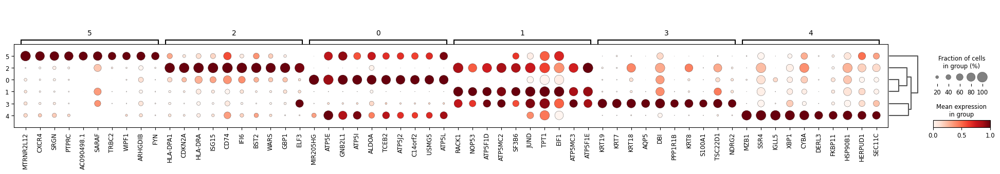

In [30]:
#Manual annotation using dotplots, I will search google for marker gene cell types
sc.pl.rank_genes_groups_dotplot(adata_ker_tum, groupby = 'adata_ker_tum_01', standard_scale = 'var', n_genes = 10, save='_Tumor Keratinocytes dotplot.png')

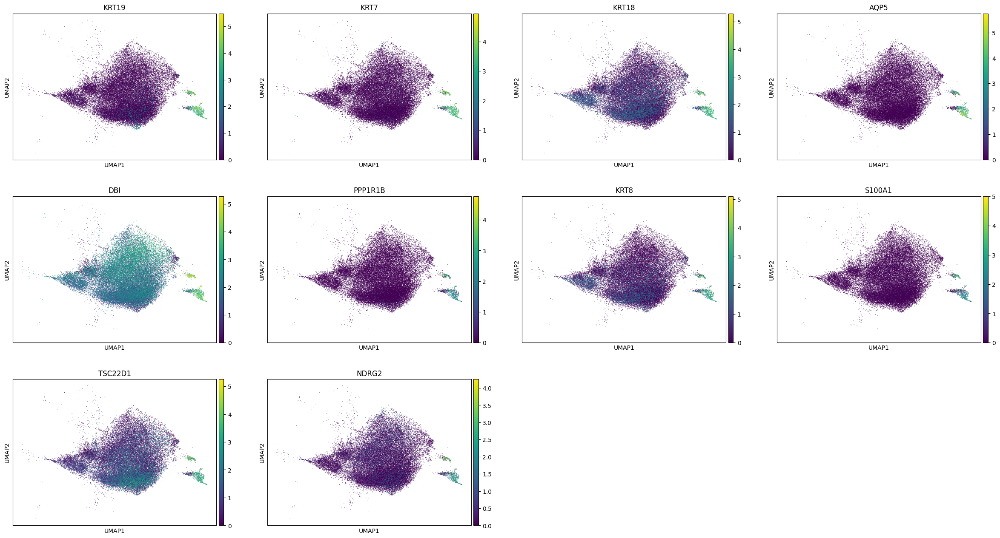

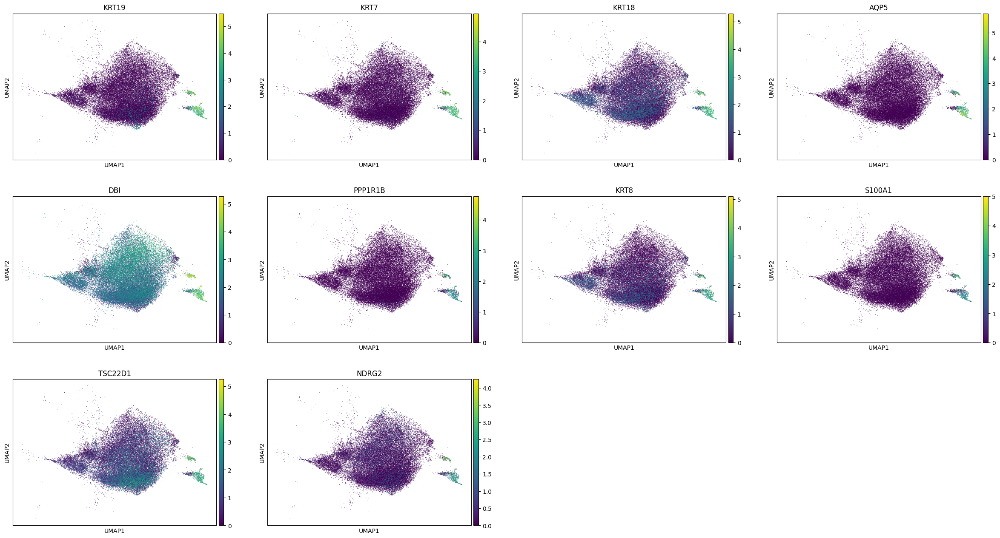

In [49]:
# Genes from cluster 3 which seems the most differentiated:
genes = ["KRT19", "KRT7", "KRT18", "AQP5", "DBI", "PPP1R1B", "KRT8", "S100A1", "TSC22D1", "NDRG2"]
Ji_genes = ['COL17A1', "KRT1", "MKI67", 'MMP10', "PTHLH"]
sc.pl.umap(adata_ker_tum.raw.to_adata(), color=genes, save='_Cluster 3 Genes.png')
sc.pl.umap(adata_ker_tum.raw.to_adata(), color=genes, save='_Ji Genes.png')

Results of TSK analysis:
Cluster 3 seems significantly different from the other clusters, it is labelled as luminal epithelial cells on my annotations but that may be incorrect. Probably from AQP5

Ji et al lists COL17A1 as Basal > This matches my annotations
KRT1 as Differentiating> This matches my annotations
MKI67, MMP10, and PTHLH all overlap with the basal area

KRT7, KRT19 are Keratinocyte specific and only found in Cluster 3

NDRG2 is a tumor suppressor gene not specific to keratinocytes
AQP5 and PPP1R1B are sweat glands
S100A1 is found in melanoma?

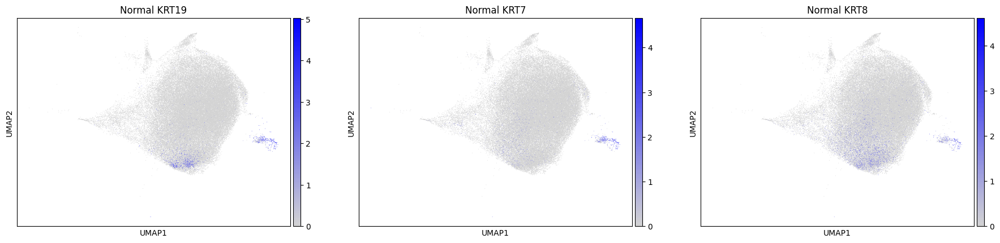

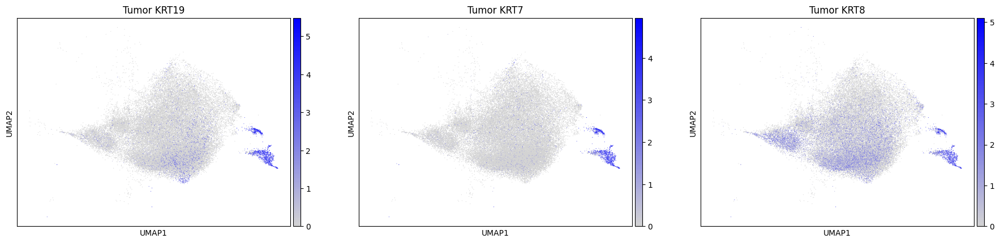

In [50]:
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Define a colormap from gray (low expression) to blue (high expression)
gray_to_blue = LinearSegmentedColormap.from_list("gray_blue", ["lightgray", "blue"])
genes = ["KRT19", "KRT7", "KRT8"]

sc.pl.umap(adata_ker_norm.raw.to_adata(),color=genes,cmap=gray_to_blue, 
           title=["Normal KRT19", "Normal KRT7", "Normal KRT8"], save='_Normal Keratinocyte_KRT19-KRT7-KRT8.png')

sc.pl.umap(adata_ker_tum.raw.to_adata(),color=genes,cmap=gray_to_blue, 
           title=["Tumor KRT19", "Tumor KRT7", "Tumor KRT8"], save='_Tumor Keratinocyte_KRT19-KRT7-KRT8.png')

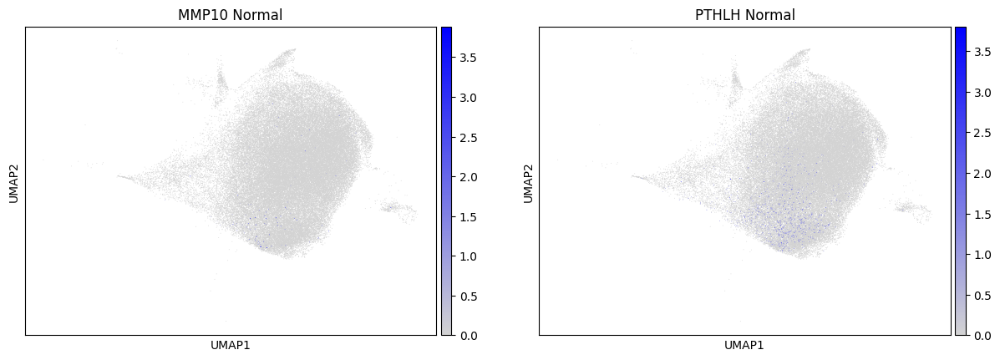

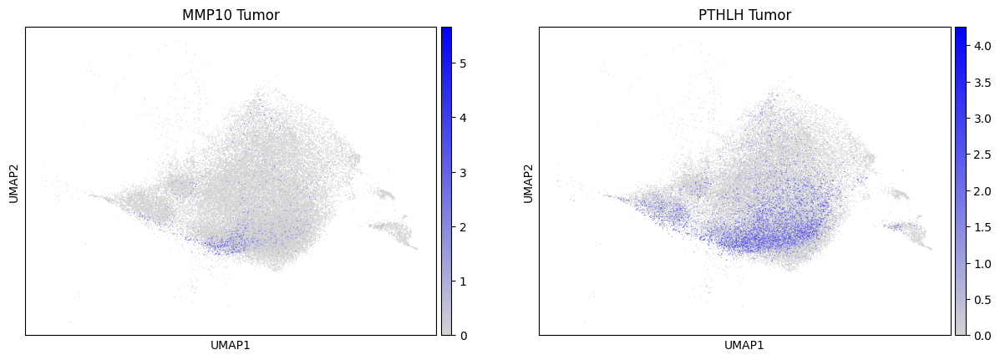

In [33]:
sc.pl.umap(adata_ker_norm.raw.to_adata(),color=["MMP10", "PTHLH"],cmap=gray_to_blue, title = ["MMP10 Normal", "PTHLH Normal"])
sc.pl.umap(adata_ker_tum.raw.to_adata(),color=["MMP10", "PTHLH"],cmap=gray_to_blue, title = ["MMP10 Tumor", "PTHLH Tumor"])

### Preparing DEG analysis

In [51]:
sc.write("/data/BCI-SingleCell/SCC_Atlas/Sam_Nicholls/adata_ker_tum.h5ad", adata_ker_tum)

### AUCell Results

In [93]:
tsk_score = pd.read_csv("TSK_AUC_score_Threshold_HR.csv", index_col=0)

In [99]:
tsk_score

,AUC_score,assignment
cell_ID,,
AAACCTGAGAAACCTA,0.066667,inactive
AAACCTGAGCATCATC,0.216374,inactive
AAACCTGAGCGGATCA,0.001170,inactive
AAACCTGAGCTCAACT,0.149708,inactive
AAACCTGAGCTCCTTC,0.079532,inactive
...,...,...
TTTGTTGCAGTGTATC-1,0.090058,inactive
TTTGTTGGTCAGGTAG-1,0.267836,inactive
TTTGTTGTCCCATTCG-1,0.086550,inactive


In [108]:
# Remove duplicates from tsk_score only
tsk_score = tsk_score.loc[~tsk_score.index.duplicated(keep='first')]

# Make sure tsk_score aligns with adata.obs
tsk_score = tsk_score.reindex(adata.obs.index)
print((adata.obs.index == tsk_score.index).all())

True


In [109]:
adata.obs = pd.concat([adata.obs, tsk_score], axis=1)
adata.obs['assignment'] = adata.obs['assignment'].replace({'active': 'TSK_sig_positive', 'inactive': 'TSK_sig_negative'})

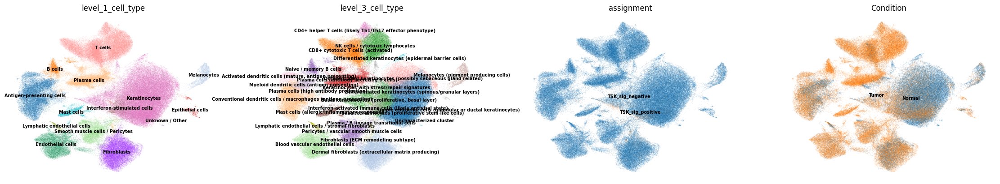

In [117]:
sc.pl.umap(adata,  color=['level_1_cell_type', 'level_3_cell_type', 'assignment', 'Condition'], color_map='RdPu', wspace=0.1, frameon=False,
           legend_loc='on data', legend_fontsize=7,
          )

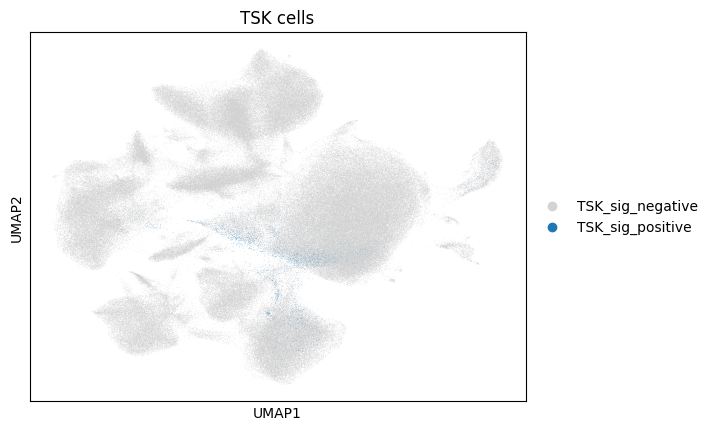

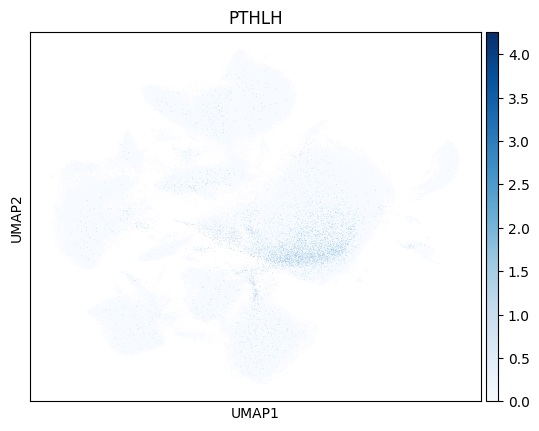

In [162]:
subset = adata.copy()

# Reorder categories to plot TSK_sig_positive last
cats = adata.obs['assignment'].astype('category')
cats = cats.cat.reorder_categories(
    [c for c in cats.cat.categories if c != 'TSK_sig_positive'] + ['TSK_sig_positive']
)
subset.obs['assignment'] = cats

# Define colors: gray for others, blue for TSK_sig_positive
colors = {cat: '#d3d3d3' for cat in cats.cat.categories}
colors['TSK_sig_positive'] = '#1f77b4'

sc.pl.umap(subset, color='assignment', palette=colors, title='TSK cells')
sc.pl.umap(subset.raw.to_adata(), color='PTHLH', color_map='Blues', title='PTHLH')